In [ ]:
# To-MountDrive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
### Extracting
#!unzip "drive/MyDrive/Project-DogVision/dog-breed-identification.zip" -d "drive/MyDrive/Project-DogVision"

# Multiclass Dog-Breed Classification
### With TensorFlow 2.0 and TensorFlow Hub
1.Problem
2.Data
3.Evaluation
4.Features



In [ ]:
# Importing Tensor-Flow
# Import TensorFlow Hub

import tensorflow as tf
import tensorflow_hub as hub
print(tf.__version__),
print(hub.__version__)
7857421
#Checking for gpu availibility
print("GPU!!, " if tf.config.list_physical_devices("GPU") else "NOT AVAILABLE!")

2.15.0
0.16.1
NOT AVAILABLE!


# Getting the data ready.

1.Converting the data into numerical format.


                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever
82.0


<Axes: xlabel='breed'>

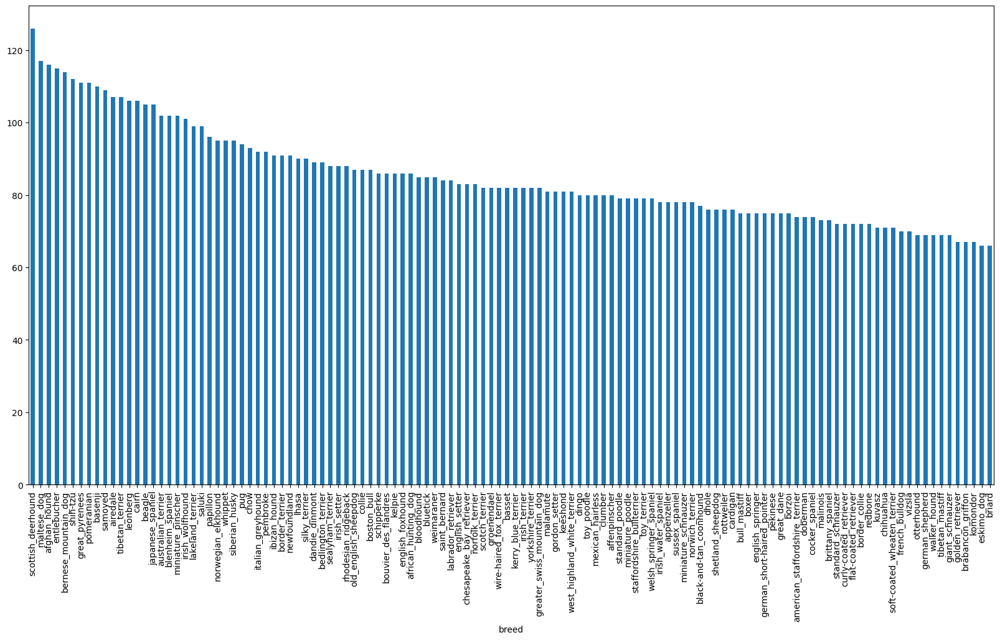

In [ ]:
# Checking the labels
import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/Project-DogVision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

# median most value for number of pics per class here is 82(which means we have have 82 images per class on average)
print(labels_csv["breed"].value_counts().median())
# number of pictures for each breed
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

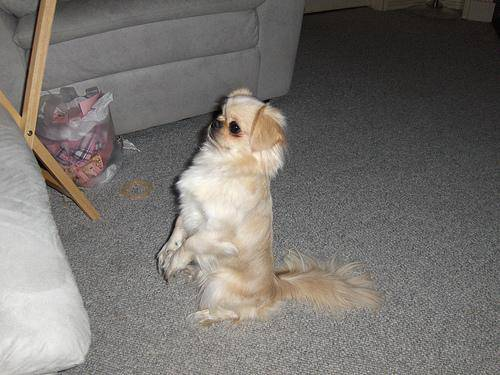

In [ ]:
# Viewing an image
from IPython.display import Image
Image("drive/MyDrive/Project-DogVision/train/001cdf01b096e06d78e9e5112d419397.jpg")

In [ ]:
# Getting image and their labels
# Pathnames from the image ID's

Filenamess = ["drive/MyDrive/Project-DogVision/train/"+ fname +".jpg" for fname in labels_csv["id"]]
Filenamess[:15]

['drive/MyDrive/Project-DogVision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Project-DogVision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Project-DogVision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Project-DogVision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Project-DogVision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Project-DogVision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Project-DogVision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Project-DogVision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Project-DogVision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Project-DogVision/train/0042188c895a2f14ef64a918ed9c7b64.jpg',
 'drive/MyDrive/Project-DogVision/train/004396df1acd0f1247b740ca2b14616e.jpg',
 'drive/MyDrive/Project-DogVision/train/0067dc3eab0b3c3ef0439477624d85d6.jpg',
 'drive/MyDrive/Project-DogVision/train/00693b8bc247

In [ ]:
# To check if our file names have the same lengtht as the files in the folder

import os
if len(os.listdir("drive/MyDrive/Project-DogVision/train")[:10])==len(Filenamess[:10]):
  print(1);
else:
  print(0)

#Thus Checked


1


In [ ]:
# Turning data to Numbers
# preparing our labels

import numpy as np
all_labels = labels_csv["breed"].to_numpy()
all_labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
# Finding the unique breeds
Unique_breeds = np.unique(all_labels)
#Unique_breeds
# Turning array into Boolen-Array for each Unique breed
boolean_variables = [i == Unique_breeds for i in all_labels]
boolean_variables[:6]
boolean_variables[9]

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False,  True, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turning booleans into Integers
print(f"For {all_labels[9]} the array is present in index {boolean_variables[9].argmax()} and the list goes as: {boolean_variables[9].astype(int)} ")

For scottish_deerhound the array is present in index 97 and the list goes as: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0] 


In [ ]:
# Array_for_all_breeds_inboolean = []

# Validation-Set
## Setting Up X and Y

x = Filenamess
y = boolean_variables

# len(Filenamess)==len(boolean_variables) -  We get true


In [ ]:
# Starting with 1000 Images

Num_images = 1000.0 # @param {type:"raw"}

In [ ]:
# Using sklearn to Train-Test-Split and make **validation set**
from sklearn.model_selection import train_test_split

x_train, x_val, y_train, y_val = train_test_split(x[:Num_images], y[:Num_images], test_size=0.2, random_state=42)

len(x_train), len(y_train), len(x_val), len(y_val)


(800, 800, 200, 200)

# Pre-Proceessing Our Data (into Tensors)

In [ ]:
# Writng a function that does:
'''
1.Take Image filepath as input
2.Saving it using tensorFlow
3.Turn image into tensors
4.Convert, image colour channels (from 0-255 to 0-1, by dfloat)
4.Resize image to (224,224)
5.Get back the modified image

'''


'\n1.Take Image filepath as input\n2.Saving it using tensorFlow\n3.Turn image into tensors\n4.Convert, image colour channels (from 0-255 to 0-1, by dfloat)\n4.Resize image to (224,224)\n5.Get back the modeified image\n\n'

In [ ]:
# About Image
from matplotlib.pyplot import imread
image = imread(Filenamess[1]) # -Gives info about the image, height ,width,rgb
print(image)
#Changing it to a tensor
imagetf = tf.constant(image) # = changes anything to tensor
print(image.shape), # - Gives the shape
print(imagetf)


[[[ 51  34  26]
  [ 55  38  30]
  [ 61  43  33]
  ...
  [127  92  62]
  [ 77  42  12]
  [167 132 102]]

 [[ 63  44  37]
  [ 64  46  36]
  [ 63  45  35]
  ...
  [113  82  54]
  [ 44  13   0]
  [ 71  40  12]]

 [[ 58  38  29]
  [ 58  38  27]
  [ 57  37  26]
  ...
  [ 60  33  12]
  [ 53  26   5]
  [ 63  36  15]]

 ...

 [[192 110  34]
  [183 104  29]
  [183 103  34]
  ...
  [ 52  26  27]
  [ 34   8   9]
  [ 21   0   0]]

 [[181  99  23]
  [200 121  46]
  [207 127  58]
  ...
  [ 35   7   6]
  [ 59  29  29]
  [ 88  60  57]]

 [[182 100  24]
  [203 124  49]
  [216 136  67]
  ...
  [ 38   9   5]
  [116  85  80]
  [192 163 155]]]
(375, 500, 3)
tf.Tensor(
[[[ 51  34  26]
  [ 55  38  30]
  [ 61  43  33]
  ...
  [127  92  62]
  [ 77  42  12]
  [167 132 102]]

 [[ 63  44  37]
  [ 64  46  36]
  [ 63  45  35]
  ...
  [113  82  54]
  [ 44  13   0]
  [ 71  40  12]]

 [[ 58  38  29]
  [ 58  38  27]
  [ 57  37  26]
  ...
  [ 60  33  12]
  [ 53  26   5]
  [ 63  36  15]]

 ...

 [[192 110  34]
  [183 104 

In [ ]:
# defining Image Size
IMG_SIZE = 224

# Making function for pre proccessing the image
def process_image(image_path, img_size=IMG_SIZE):
  image = tf.io.read_file(image_path) #  - Reads the file
  #Turning jpg to numeric tensors
  image = tf.image.decode_jpeg(image, 3 )#channel=3)
  #Convert the colour channel values(from 0-255 to 0-1)
  image = tf.image.convert_image_dtype(image, tf.float32) #(also known as Normalization)
  # Resizing the image (224, 244)
  image = tf.image.resize(image, size=[IMG_SIZE,IMG_SIZE])

  return image

# Turning data into batches
 ## So that 10k images doesn't exceed the memory limit
 ## so we make batches of 32 at a time for better fitting

In [ ]:
# Creating a function to return a tensor tuple (image, label)
def image_tuple(image_path, label):
  image = process_image(image_path)
  return image, label

#process_image(x[40]) , tf.constant(y[40])
image_tuple(x[40], y[40])

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.99609005, 0.96119833, 0.95770377],
         [0.98501533, 0.94666374, 0.93379605],
         [0.99749774, 0.9770274 , 0.9565523 ],
         ...,
         [0.34569168, 0.5497533 , 0.22850783],
         [0.4276134 , 0.6322353 , 0.33483163],
         [0.36833197, 0.5772412 , 0.29097825]],
 
        [[0.9687435 , 0.965289  , 0.9172323 ],
         [0.94134724, 0.93233955, 0.8760108 ],
         [0.92182285, 0.9180851 , 0.8512452 ],
         ...,
         [0.36644298, 0.57037514, 0.24943131],
         [0.36225268, 0.5662274 , 0.2703323 ],
         [0.34930357, 0.5534058 , 0.27435333]],
 
        [[0.82989013, 0.87487435, 0.75133675],
         [0.7506709 , 0.7958162 , 0.66784185],
         [0.75523835, 0.8078179 , 0.67545015],
         ...,
         [0.40426058, 0.60512996, 0.2932135 ],
         [0.35947898, 0.55773896, 0.2682605 ],
         [0.38644102, 0.5856088 , 0.3115852 ]],
 
        ...,
 
        [[0.45484307, 0.5300532 

In [ ]:
# Now lets turn all our x and y into Batches
Batch_Size = 32

#Writing the funciton
def create_data_batches(x, y=None, batch_size=Batch_Size, valid_data=False, test_data=False):
  # For Test Data ->
  if test_data:
    print("Creating test data Batches")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x))) # Only Filepaths (no labels)
    data_batch = data.map(process_image).batch(Batch_Size)
    return data_batch
   # For valid Data ->
  elif valid_data:
    print("Creating validation data Batches")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # Filepaths
                                         tf.constant(y))) #labels
    data_batch = data.map(image_tuple).batch(Batch_Size)
    # For Training Data ->
  else:
    print("Creating train data Batches")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # Filepaths
                                               tf.constant(y)))
    # Shuffling pathnames and labels before mapping is faster than shuffling images
    data = data.shuffle(buffer_size=len(x))

    data = data.map(image_tuple)
    # Turning training dataset into batches
    data_batch = data.batch(Batch_Size)

  return data_batch

In [ ]:
# Creating Training and validation Batches
train_data = create_data_batches(x_train, y_train)
valid_data = create_data_batches(x_val, y_val, valid_data=True)

Creating train data Batches
Creating validation data Batches


In [ ]:
# Checking attributes to the above data batches
train_data.element_spec, valid_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

In [ ]:
# Visualizing the formed batches

# Creating function for Viewing batches
import matplotlib.pyplot as plt
def show_25images(images, labels):
  plt.figure(figsize=(10,10))
  for i in range(25): # Looping through 25 images
    ax = plt.subplot(5,5, i+1)
    plt.imshow(images[i]) # Displaying the image
    plt.title(Unique_breeds[labels[i].argmax()])
    plt.axis("off")


In [ ]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

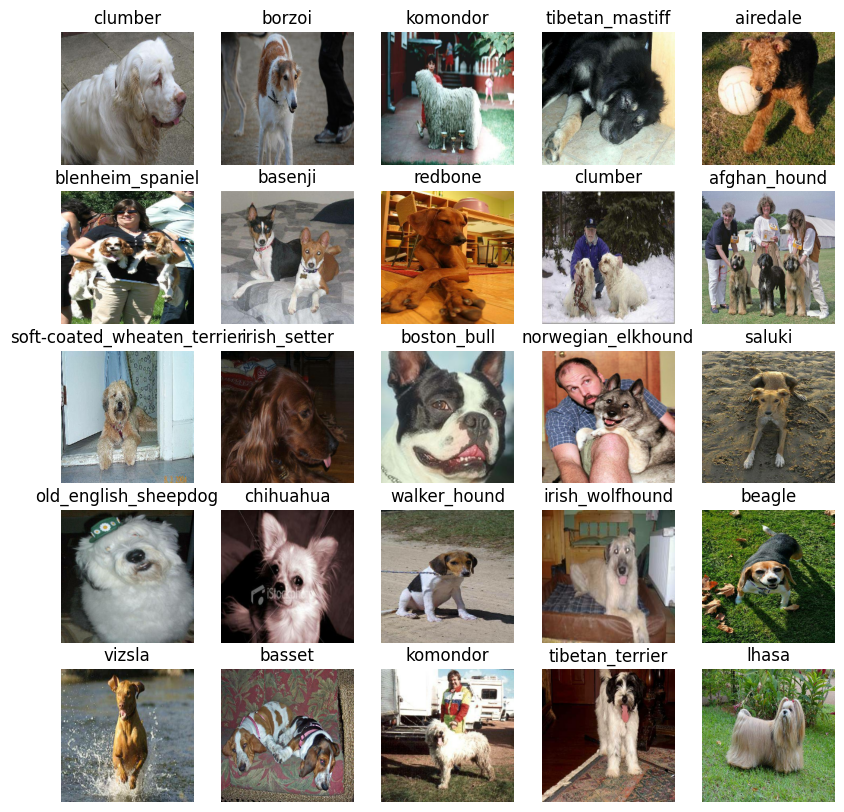

In [ ]:
# Visualizing - Training Dataset
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25images(train_images, train_labels)

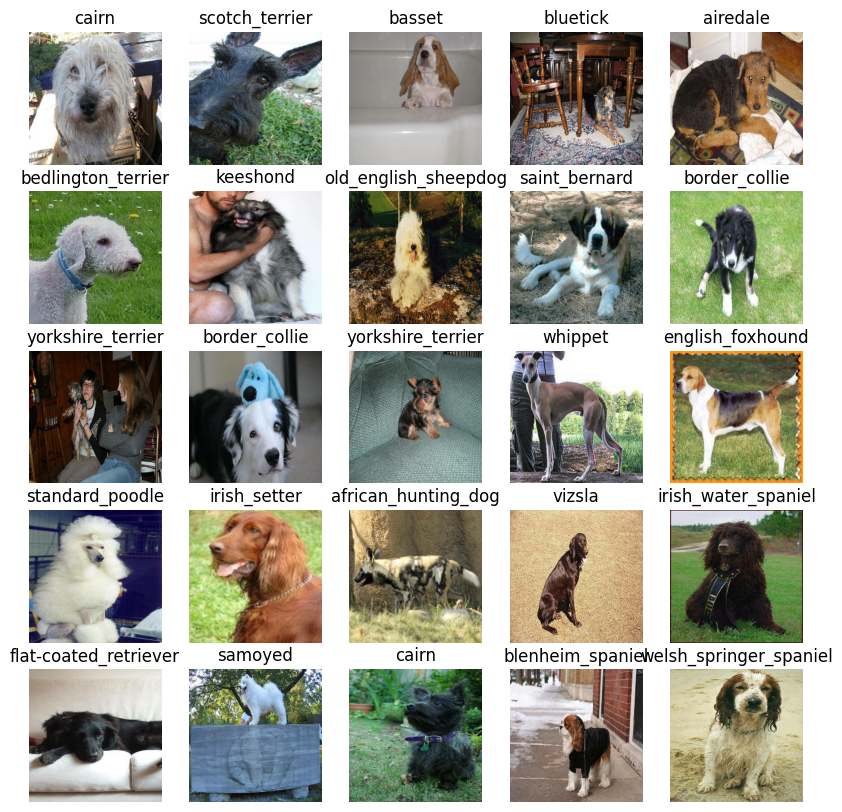

In [ ]:
# Visualizing - Validation Dataset
valid_images, valid_labels = next(valid_data.as_numpy_iterator())
show_25images(valid_images, valid_labels)

# Building a Model
### 1.**Input Shape** (Image shape)
### 2.**Output Shape**(Output shape)
### 3.**Url of the model**

In [ ]:
IMG_SIZE

224

In [ ]:
# Input Shape
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # Heigth, Width, Channel
# Output Shape
OUTPUT_SHAPE = len(Unique_breeds)
# Modle from Tensor Flow Hub (for classfication)
MODEl_URL = "https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1"

In [ ]:
# We Use Keras API which is a high level API for builiding and training DL models.
# Creating a function which defines a layer in sequential fashion, compiles the model , build it and finally returns the model

def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEl_URL):
  print("Building with:", MODEl_URL)

  #Setup
  model=tf.keras.Sequential([
      hub.KerasLayer(MODEl_URL), # Layer1
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                            activation="softmax") # Layer2
      ])

  #Compile
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  #Build
  model.build(INPUT_SHAPE)
  return model

In [ ]:
model = create_model()
model.summary()

Building with: https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


#  Tensor Board Callback

#### Creating a callbacks - callbacks are helpfull functions a model can use during training to save progress, check progress, or stop training early if a model stops working

1. Tensorboard notebook extension
2. creating a callback , which is able to save logs to a directory and pass it to our model's fit fucntion
3. Visualize our data (after model training)

In [ ]:
# Load Tensorboard extension
%load_ext tensorboard

In [ ]:
import datetime
# Creaitng a function for TenosorBoard Callback
def create_tensorboard_callback():
  logdir = os.path.join("drive/MyDrive/Project-DogVision/logs",
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

#Early stopping Callback


In [ ]:
# Creating Early Stopping Callback
early_stopping =  tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                   patience=3)


# Training a model

In [ ]:
# Training a model on subset of data

## First model - 1000 images (Seeing everything is workng fine)
NUM_EPOCHS = 100 #@param {type:"slider", max:100, min:10}

In [ ]:
# creating a function which trains a model
'''
1. Create a model
2. setup a tensorboard callbacks
3. call the fit fucntion
4. return the model

'''

def train_model():
  model = create_model()
  tensorboard_callback  = create_tensorboard_callback()
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data = valid_data,
            validation_freq=1,
            callbacks=[tensorboard_callback, early_stopping]
  )
  return model

In [ ]:
model = train_model()

Building with: https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1
Epoch 1/100
25/25 [==============================] - 380s 15s/step - loss: 4.6592 - accuracy: 0.1088 - val_loss: 3.5136 - val_accuracy: 0.2550
Epoch 2/100
25/25 [==============================] - 4s 145ms/step - loss: 1.7095 - accuracy: 0.6650 - val_loss: 2.1595 - val_accuracy: 0.5250
Epoch 3/100
25/25 [==============================] - 5s 214ms/step - loss: 0.5793 - accuracy: 0.9300 - val_loss: 1.6883 - val_accuracy: 0.5950
Epoch 4/100
25/25 [==============================] - 5s 190ms/step - loss: 0.2561 - accuracy: 0.9875 - val_loss: 1.4944 - val_accuracy: 0.6100
Epoch 5/100
25/25 [==============================] - 4s 175ms/step - loss: 0.1507 - accuracy: 0.9950 - val_loss: 1.4101 - val_accuracy: 0.6400
Epoch 6/100
25/25 [==============================] - 5s 193ms/step - loss: 0.1014 - accuracy: 0.9987 - val_loss: 1.3665 - val_accuracy: 0.6550
Epoch 7/100
25/25 [=========================

#Checking the tensorboard logs
#### The tensorboard magic function wil access the logs directly and visualize its content



In [ ]:
%tensorboard --logdir drive/MyDrive/Project-DogVision/logs

<IPython.core.display.Javascript object>

In [ ]:
# Make, Evaluating and Predicting with a trained model
predictions = model.predict(valid_data, verbose=1)
predictions

7/7 [==============================] - 1s 116ms/step


array([[4.26404551e-03, 2.04041251e-04, 1.31867162e-03, ...,
        9.27100773e-04, 2.29921261e-05, 2.10535480e-03],
       [1.71305402e-03, 7.67645950e-04, 2.39508562e-02, ...,
        4.07804357e-04, 4.80304565e-03, 1.10967834e-04],
       [2.19423746e-05, 5.41682384e-05, 1.74476172e-05, ...,
        1.57652848e-05, 9.50594676e-06, 6.71623638e-05],
       ...,
       [6.99621251e-06, 1.72097371e-05, 4.34597641e-05, ...,
        9.15230339e-06, 4.80690687e-05, 4.84078409e-05],
       [3.71084665e-03, 4.31101689e-05, 3.19729064e-04, ...,
        3.21981148e-04, 8.95287303e-05, 2.65472010e-02],
       [4.68102866e-04, 5.64265883e-06, 9.14262564e-05, ...,
        2.26519350e-03, 2.68032949e-04, 1.79180606e-05]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
# prediction on a given index.
Index = 45
print(predictions[Index])
print(f"max value of predictions: {np.max(predictions[Index])}")
print(f"Sum is {np.sum(predictions[Index])}")
print(f"MaxIndex: {np.argmax(predictions[Index])}")
print(f"Predicted label {Unique_breeds[np.argmax(predictions[Index])]}")

[2.01542251e-04 1.78393806e-04 6.43106978e-05 1.48037088e-05
 3.99848868e-05 5.82935718e-05 5.68169480e-06 7.83113937e-05
 4.83435724e-05 2.94133974e-06 1.17002215e-04 9.33900956e-05
 6.30533759e-06 2.79088795e-06 2.16202432e-04 5.84042255e-06
 4.77995854e-05 1.61049447e-05 1.02398253e-05 5.61135494e-05
 8.67271796e-04 7.69163034e-06 5.20606000e-06 6.97508440e-05
 1.01918822e-05 1.97219284e-04 3.64423468e-04 5.14709391e-05
 1.16671563e-05 2.75232287e-05 6.16390549e-04 2.17207144e-05
 4.50526568e-05 9.65060754e-05 4.10243729e-06 2.14996635e-05
 1.36828210e-04 5.15641412e-04 3.63051004e-05 1.11860700e-05
 9.47594617e-06 1.74205234e-05 3.68115725e-05 1.72033138e-03
 1.94577282e-04 1.39923999e-04 2.18428977e-05 3.90536479e-05
 8.99645383e-05 6.06409958e-05 4.97702786e-06 1.21403373e-05
 5.37791238e-05 2.98249943e-05 9.45145726e-01 5.32579907e-06
 2.85910664e-05 2.07737612e-05 2.60946545e-05 6.86634681e-04
 3.62325663e-05 1.39619333e-05 2.24474963e-04 1.93983924e-05
 3.40827421e-04 2.970439

In [ ]:
## Turning prediction probablities to their respective labels

def get_pred_labels(prediction_probabilities):
  return Unique_breeds[np.argmax(prediction_probabilities)] ## turn array of predictions probablities into a label
  # Gets a predidcted label based on an array

# pred_label = get_pred_labels(predictions[81])
# pred_label


# Unbatching Validation dataset - Batch Dataset
#### to compare them to validation truth labels

In [ ]:
# Creating a Function to unbatch validation dataset

def unbatch_data(data):
  images=[]
  labels=[]
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(Unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchifying the validation data set
val_images, val_labels = unbatch_data(valid_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

# Making functiont o visualize the >
'''

predicted label

validation label

valudation images

'''


In [ ]:
def plot_pred(predictions_probablities, labels, images, n=1):
  pred_prob, true_label, image = predictions_probablities[n], labels[n], images[n]  # - Viewing this for label n

  #Pred_label
  pred_label = get_pred_labels(pred_prob)

  # Plot images, and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change Colour of title on predicitons
  if pred_label == true_label:
    color = "green"
  else:
    color= "red"

  # Change Plot title to predicted, probablity of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color
                                    )

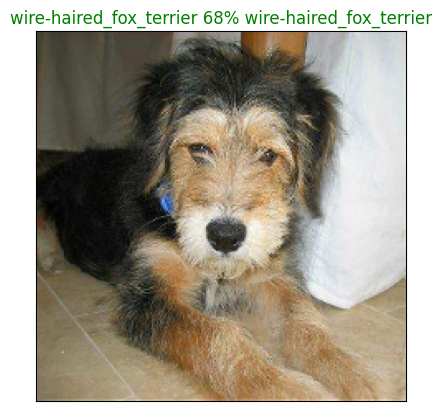

In [ ]:
plot_pred(predictions_probablities=predictions,
          labels=val_labels,
          images=val_images,
          n=61)

# Model to view top 10 Predictions
##The fucntion will ->
#### take an input of prediction probablities array , and truth array , and an integer
#### find prediction using get_pred_label()
#### for top 10 :
### pred_prob, index , value, and labels, coloring the true labels green.

In [ ]:
def plot_pred_conf (prediction_probablitiees, labels, n=1):
  pred_prop, true_label = prediction_probablitiees[n], labels[n]

  # Predicted label
  pred_label = get_pred_labels(pred_prop)

  # for top 10 prediction indexes
  top_10_pred_indexes = pred_prop.argsort()[-10:][::-1]
  # for top 10 prediction values
  top_10_pred_values = pred_prop[top_10_pred_indexes]
  # for top 10 prediction label
  top_10_pred_label = Unique_breeds[top_10_pred_indexes]

  # plot
  top_plot = plt.bar(np.arange(len(top_10_pred_label)),
                     top_10_pred_values,
                     color="grey")

  plt.xticks(np.arange(len(top_10_pred_label)),
             labels=top_10_pred_label,
             rotation="vertical")
  # Change
  if np.isin(true_label, top_10_pred_label):
    top_plot[np.argmax(top_10_pred_label == true_label)].set_color("green")
  else:
    pass

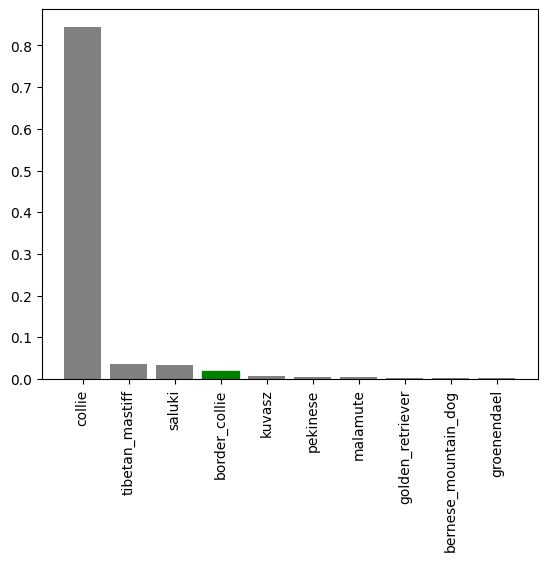

In [ ]:
plot_pred_conf(prediction_probablitiees=predictions,
               labels = val_labels,
               n=9)

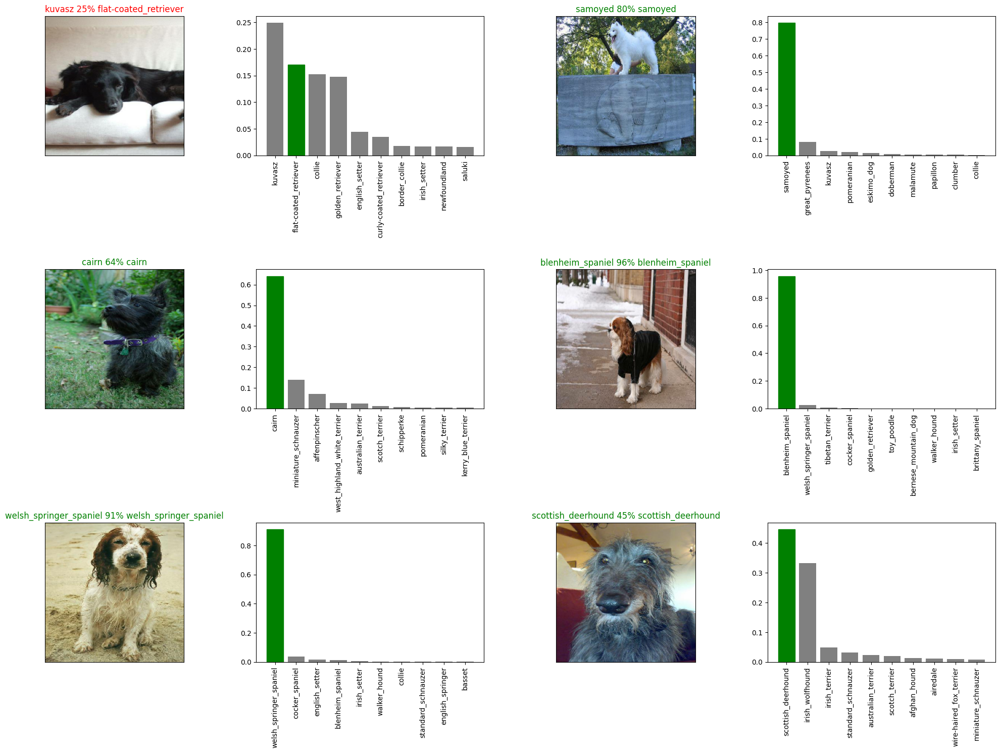

In [ ]:
# Function to check predicitons and their diff values.
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(predictions,
            labels = val_labels,
            images = val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probablitiees=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.5)
plt.show()

#  Saving and reloading Our Model



In [ ]:
# Function to save our model

def save_model(model, suffix=None):
  modeldir = os.path.join("drive/MyDrive/Project-DogVision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # - Save format
  print(f"Saving model to {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
# Function to load a model
def load_model(model_path):
  print(f"Loading a model from {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer": hub.KerasLayer})
  return model

In [ ]:
# Saving and loading the model
save_model(model, suffix="1000-images-MobileNetV2-adam")

Saving model to drive/MyDrive/Project-DogVision/models/20240702-05521719899558-1000-images-MobileNetV2-adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/Project-DogVision/models/20240702-05521719899558-1000-images-MobileNetV2-adam.h5'

In [ ]:
loaded_model = load_model("drive/MyDrive/Project-DogVision/models/20240702-05521719899558-1000-images-MobileNetV2-adam.h5")


Loading a model from drive/MyDrive/Project-DogVision/models/20240702-05521719899558-1000-images-MobileNetV2-adam.h5


# Evaluating the pre-saved model


In [ ]:
# Pre-saved model
model.evaluate(valid_data)

7/7 [==============================] - 1s 102ms/step - loss: 1.2585 - accuracy: 0.6700


[1.258460283279419, 0.6700000166893005]

In [ ]:
# loaded Model
loaded_model.evaluate(valid_data)

7/7 [==============================] - 1s 104ms/step - loss: 1.2585 - accuracy: 0.6700


[1.258460283279419, 0.6700000166893005]

In [ ]:
#  The saved and the actuall model has the same evaluation score

# Training the model on 10k images
1. Creating Data Batches
2. Creating Full model
3. Creating a full model callback
4. Creating a full model early stopping
5. Fitting the full model
6. Saving the full model

In [ ]:
# Creating a batch on Full Data set
full_data = create_data_batches(x, y)

Creating train data Batches


In [ ]:
# Creating a model on full data set
full_model = create_model()

Building with: https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1


In [ ]:
# Creating a full model call back on full data set
full_model_tensorboard = create_tensorboard_callback() # - no validation set , we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

In [ ]:
# Fitting the full model

# full_model.fit(x=full_data,
#                epochs=NUM_EPOCHS,
#                callbacks=[full_model_tensorboard, full_model_early_stopping]
#                )

Epoch 1/100
320/320 [==============================] - 50s 144ms/step - loss: 1.3241 - accuracy: 0.6719
Epoch 2/100
320/320 [==============================] - 43s 133ms/step - loss: 0.3992 - accuracy: 0.8820
Epoch 3/100
320/320 [==============================] - 42s 132ms/step - loss: 0.2399 - accuracy: 0.9345
Epoch 4/100
320/320 [==============================] - 42s 132ms/step - loss: 0.1532 - accuracy: 0.9639
Epoch 5/100
320/320 [==============================] - 46s 142ms/step - loss: 0.1067 - accuracy: 0.9770
Epoch 6/100
320/320 [==============================] - 46s 142ms/step - loss: 0.0785 - accuracy: 0.9860
Epoch 7/100
320/320 [==============================] - 44s 136ms/step - loss: 0.0579 - accuracy: 0.9918
Epoch 8/100
320/320 [==============================] - 43s 135ms/step - loss: 0.0451 - accuracy: 0.9951
Epoch 9/100
320/320 [==============================] - 43s 135ms/step - loss: 0.0374 - accuracy: 0.9958
Epoch 10/100
320/320 [==============================] - 43s 133m

In [ ]:
# Saving the full model
#save_model(full_model, suffix="Full-imageset_model-MobileNetV2-Adam[Dog-Vision]2")

Saving model to drive/MyDrive/Project-DogVision/models/20240702-06201719901222-Full-imageset_model-MobileNetV2-Adam[Dog-Vision]2.h5...


'drive/MyDrive/Project-DogVision/models/20240702-06201719901222-Full-imageset_model-MobileNetV2-Adam[Dog-Vision]2.h5'

In [ ]:
# Loading the full model
loaded_full_model = load_model("drive/MyDrive/Project-DogVision/models/20240702-06201719901222-Full-imageset_model-MobileNetV2-Adam[Dog-Vision]2.h5")

Loading a model from drive/MyDrive/Project-DogVision/models/20240702-06201719901222-Full-imageset_model-MobileNetV2-Adam[Dog-Vision]2.h5


# Making Predictions on test Data-set , thats given

1. Get test image filenames
2. convert file name into test data batches, (create_data_batches)
3. set test_data to True (test_data doesn't have labels)
4. make a prediction array by passing the test batches to the predict() method called on our model.

In [ ]:
# Loading the test path
test_path = "drive/MyDrive/Project-DogVision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]

In [ ]:
# Creating test data batches
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data Batches


In [ ]:
# making predictions on fully loaded model
#test_prediction = loaded_full_model.predict(test_data,
#                                          verbose=1)

  3/324 [..............................] - ETA: 34:59

KeyboardInterrupt: 

In [ ]:
# Saving the predicitons(numpy array) array to csv file
#np.savetxt("drive/MyDrive/Project-DogVision/preds_array2.csv",test_prediction, delimiter=",")

In [ ]:
# Loading the predictions (numpy array) array form csv file
test_prediction = np.loadtxt("drive/MyDrive/Project-DogVision/preds_array.csv", delimiter=",")

# preparing dataset for the kaggle(format)

#### Probablities output in a DataFrame with an ID and a column for each different dog breed.


In [ ]:
preds_df = pd.DataFrame(columns=["id"] + list(Unique_breeds))
preds_df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# Append test Image ID's to predict DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
#test_ids
preds_df["id"] = test_ids

In [ ]:
preds_df[list(Unique_breeds)] = test_prediction
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e3d417026b89cbb57b00a7208421009d,3.405023e-09,2.449860e-11,6.648543e-08,2.340998e-10,1.356387e-09,4.959569e-07,2.876192e-08,1.590288e-05,2.004164e-11,...,7.277139e-11,6.686156e-09,6.152598e-10,5.923984e-11,6.686976e-08,1.541000e-09,1.060786e-07,1.592445e-09,2.728608e-08,1.746375e-09
1,e6cbd88414627be43910a1977ce28595,2.683639e-12,1.280133e-09,3.098900e-08,1.142462e-11,2.180161e-12,7.841581e-10,7.975801e-10,6.018674e-09,3.287925e-12,...,5.518709e-12,4.824720e-07,7.365444e-10,1.082911e-09,2.075120e-09,1.373189e-11,9.130946e-11,1.866744e-07,1.462456e-11,4.552757e-11
2,e29f03a924c493b29d17877204dd0205,1.147155e-10,4.869599e-09,3.488396e-11,9.318604e-11,1.980273e-10,1.065198e-07,3.483244e-07,1.094136e-10,9.292901e-11,...,5.483243e-12,1.464449e-10,2.737753e-08,3.116765e-08,2.546228e-07,9.194263e-10,3.092291e-12,3.187509e-11,4.563277e-10,1.898447e-11
3,dd8d95720349f85d2a795adaafc71172,1.072440e-11,2.727801e-14,5.005724e-14,2.375887e-11,4.464831e-09,2.030956e-11,1.230336e-13,3.519363e-13,1.517678e-09,...,2.087379e-12,1.141803e-13,1.989270e-06,1.988203e-09,4.947878e-10,1.156961e-11,3.877333e-11,1.826526e-12,1.936503e-12,6.526190e-11
4,e64d56f012476f124591a22648114a37,9.998211e-01,1.382397e-14,8.954011e-10,4.009920e-15,4.032814e-12,4.970762e-15,3.360544e-08,1.373873e-13,1.291980e-12,...,6.075174e-12,1.578793e-09,3.645393e-13,1.822206e-12,7.491668e-13,6.583273e-14,5.118587e-10,9.769463e-14,4.622541e-09,4.159664e-08


In [ ]:
# Saving our predictions to the actual submission file as csv
#preds_df.to_csv("drive/MyDrive/Project-DogVision/Fullmodel_Dogvision_PredictedTable-MobileNetV2.csv",
 #               index=False)

# Predicting with custom images
1. Get the image paths
2. filepath -> to batches, as our image = no labels, set - test_data=true.
3. pass the custom image to our model's predict() method
4. convert to prediction output probablities to labels
5. compare predicted == custom images.


In [ ]:
# Custom Path
custom_path = "drive/MyDrive/Project-DogVision/custom_image/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
# Creating data batches
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data Batches


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# making predictions
custom_preds = loaded_full_model.predict(custom_data,
                                         verbose=1)

1/1 [==============================] - 2s 2s/step


In [ ]:
# Get labels for custom predictions
custom_pred_labels = [get_pred_labels(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['papillon', 'norwich_terrier', 'airedale']

In [ ]:
# Getting custom images (unbatchifying())
custom_images= []
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

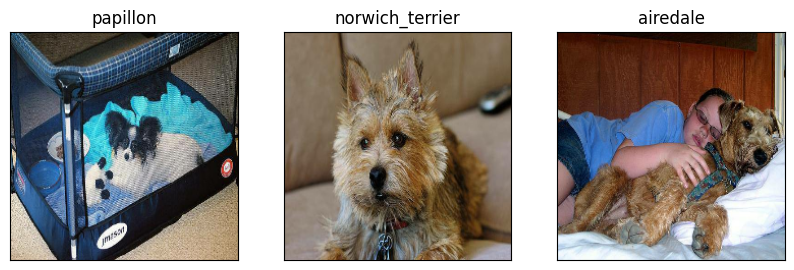

In [ ]:
# Comparing labels with predictions
plt.figure(figsize=(10,10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)

# ------------------------------------------------------------ THE END-----------------------------------------------